## Visualization and Analysis of Social Media Data

In [3]:
import pandas as pd ;
import numpy as np ;
import matplotlib.pyplot as plt ;
import seaborn as sns ; 
import statsmodels.api as sn;
from sklearn.linear_model import LinearRegression ;
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [4]:
## Data

In [82]:
user_data_1 = pd.read_csv(r"D:\Saikiran\B_tech_3_1\Data Visualization\Project\users-by-social-media-platform.csv" )
percent_of_young = pd.read_csv(r"D:\Saikiran\B_tech_3_1\Data Visualization\Project\percentage-of-young-people-engaging-in-social-networking-online.csv")
last_12_months_data = pd.read_csv(r"D:\Saikiran\B_tech_3_1\Data Visualization\Project\social_media-ww-monthly-last 12 months data.csv")

In [ ]:
## Social Media Users

In [85]:
user_data_1.columns = ["Platform" , "Year" , "Monthly_active_user"]
percent_of_young.columns = ["Platform" ,"Code" ,  "Year" , "Youth"]

In [40]:
user_data_1.head(20)

,Platform,Year,Monthly_active_user
0,Facebook,2008,100000000
1,Facebook,2009,276000000
2,Facebook,2010,517750000
3,Facebook,2011,766000000
4,Facebook,2012,979750000
5,Facebook,2013,1170500000
6,Facebook,2014,1334000000
7,Facebook,2015,1516750000
8,Facebook,2016,1753500000
9,Facebook,2017,2035750000


In [81]:
percent_of_young.columns

Index(['Entity', 'Code', 'Year',
       'Proportion of people age 16-24 engaging in social networking online (%)'],
      dtype='object')

In [86]:
percent_of_young.head()

,Platform,Code,Year,Youth
0,Australia,AUS,2013,87.676
1,Austria,AUT,2014,86.958
2,Belgium,BEL,2014,88.963
3,Chile,CHL,2014,87.183
4,Czech Republic,CZE,2014,91.911


In [70]:
#platforms
platforms = list(set(user_data_1.Platform))
platforms

['Facebook',
 'Tumblr',
 'Weibo',
 'Google Buzz',
 'Snapchat',
 'Orkut',
 'Hi5',
 'Pinterest',
 'WeChat',
 'Instagram',
 'TikTok',
 'Whatsapp',
 'Flickr',
 'YouTube',
 'Twitter',
 'Reddit',
 'MySpace',
 'Friendster',
 'Google+']

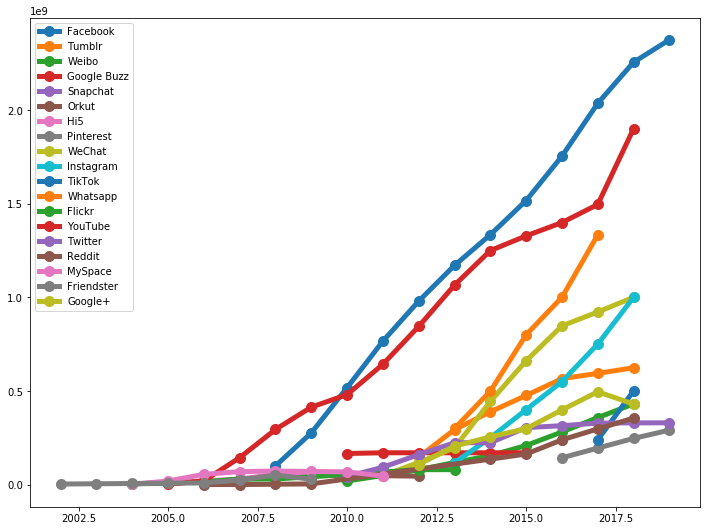

In [73]:
plt.figure(figsize=(12,9))
for i in platforms:
    plt.plot(user_data_1[user_data_1["Platform"] == i].Year.tolist(), user_data_1[user_data_1["Platform"] == i].Monthly_active_user.tolist(),marker="." , markersize=20 , label=i , linewidth=5 )
plt.legend()



<BarContainer object of 10 artists>

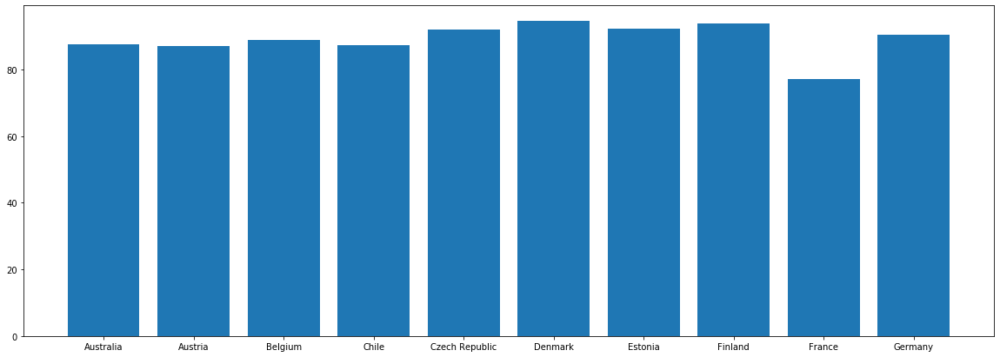

In [101]:
plt.figure(figsize=(20,7))
plt.bar(percent_of_young["Platform"].head(10) , percent_of_young["Youth"].head(10))

## Analysing Facebook users

In [104]:
user_data_1.isnull().sum()

Platform               0
Year                   0
Monthly_active_user    0
dtype: int64

In [105]:
user_data_1.head()

,Platform,Year,Monthly_active_user
0,Facebook,2008,100000000
1,Facebook,2009,276000000
2,Facebook,2010,517750000
3,Facebook,2011,766000000
4,Facebook,2012,979750000


In [108]:
facebook_users = user_data_1[user_data_1["Platform"] == "Facebook"]

In [114]:
facebook_users["Year"].dtype

dtype('int64')

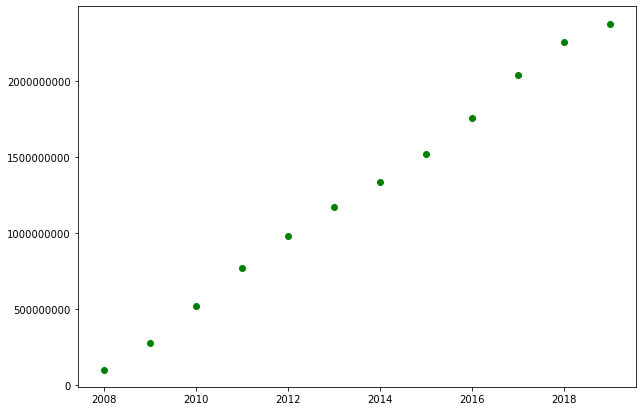

In [165]:
fig, ax = plt.subplots(figsize=(10,7))
ax.scatter(facebook_users["Year"] , facebook_users["Monthly_active_user"],color="g")
ax.ticklabel_format(style="plain")

In [121]:
l = LinearRegression()


In [129]:
x = facebook_users[["Year"]]
y =  facebook_users["Monthly_active_user"]



In [130]:
l.fit(x,y)

LinearRegression()

In [142]:
predicted  = pd.DataFrame()
predicted["Year"] = [2021,2022,2023]
predicted["Users"] = l.predict([[2020],[2022],[2023]])

In [150]:
predicted

,Year,Users
0,2021,2624329545.455
1,2022,3045142482.518
2,2023,3255548951.049


## Analysis on Youtube Video Data

In [4]:
youtube_data = pd.read_excel(r"D:\Saikiran\B_tech_3_1\Data Visualization\Project\USYoutubeData.xlsx")


In [169]:
## Checking for Null Values

In [5]:
x = youtube_data["publish_time"].tolist()
for i in range(len(x)):
    x[i] = x[i][:10]

In [6]:
print(x[:10])

['2017-11-13', '2017-11-13', '2017-11-12', '2017-11-13', '2017-11-12', '2017-11-13', '2017-11-12', '2017-11-12', '2017-11-13', '2017-11-13']


In [7]:
youtube_data["Date_uploaded"] = x


In [8]:
youtube_data.head(20)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,Date_uploaded
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,2017-11-13
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",2017-11-13
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,2017-11-12
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,2017-11-13
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,2017-11-12
5,gHZ1Qz0KiKM,17.14.11,2 Weeks with iPhone X,iJustine,28,2017-11-13T19:07:23.000Z,"ijustine|""week with iPhone X""|""iphone x""|""appl...",119180,9763,511,1434,https://i.ytimg.com/vi/gHZ1Qz0KiKM/default.jpg,False,False,False,Using the iPhone for the past two weeks -- her...,2017-11-13
6,39idVpFF7NQ,17.14.11,Roy Moore & Jeff Sessions Cold Open - SNL,Saturday Night Live,24,2017-11-12T05:37:17.000Z,"SNL|""Saturday Night Live""|""SNL Season 43""|""Epi...",2103417,15993,2445,1970,https://i.ytimg.com/vi/39idVpFF7NQ/default.jpg,False,False,False,Embattled Alabama Senate candidate Roy Moore (...,2017-11-12
7,nc99ccSXST0,17.14.11,5 Ice Cream Gadgets put to the Test,CrazyRussianHacker,28,2017-11-12T21:50:37.000Z,"5 Ice Cream Gadgets|""Ice Cream""|""Cream Sandwic...",817732,23663,778,3432,https://i.ytimg.com/vi/nc99ccSXST0/default.jpg,False,False,False,Ice Cream Pint Combination Lock - http://amzn....,2017-11-12
8,jr9QtXwC9vc,17.14.11,The Greatest Showman | Official Trailer 2 [HD]...,20th Century Fox,1,2017-11-13T14:00:23.000Z,"Trailer|""Hugh Jackman""|""Michelle Williams""|""Za...",826059,3543,119,340,https://i.ytimg.com/vi/jr9QtXwC9vc/default.jpg,False,False,False,"Inspired by the imagination of P.T. Barnum, Th...",2017-11-13
9,TUmyygCMMGA,17.14.11,Why the rise of the robots won’t mean the end ...,Vox,25,2017-11-13T13:45:16.000Z,"vox.com|""vox""|""explain""|""shift change""|""future...",256426,12654,1363,2368,https://i.ytimg.com/vi/TUmyygCMMGA/default.jpg,False,False,False,"For now, at least, we have better things to wo...",2017-11-13


In [189]:
youtube_data.isnull().sum()

video_id                    0
trending_date               0
title                       0
channel_title               0
category_id                 0
publish_time                0
tags                        0
views                       0
likes                       0
dislikes                    0
comment_count               0
thumbnail_link              0
comments_disabled           0
ratings_disabled            0
video_error_or_removed      0
description               570
Date_uploaded               0
dtype: int64

In [172]:
## No Nulls 

(array([ 674.,  499., 1067.,  811., 1002.,  863., 1597., 2307., 1014.,
         166.]),
 array([  0. ,  10.7,  21.4,  32.1,  42.8,  53.5,  64.2,  74.9,  85.6,
         96.3, 107. ]),
 <a list of 10 Patch objects>)

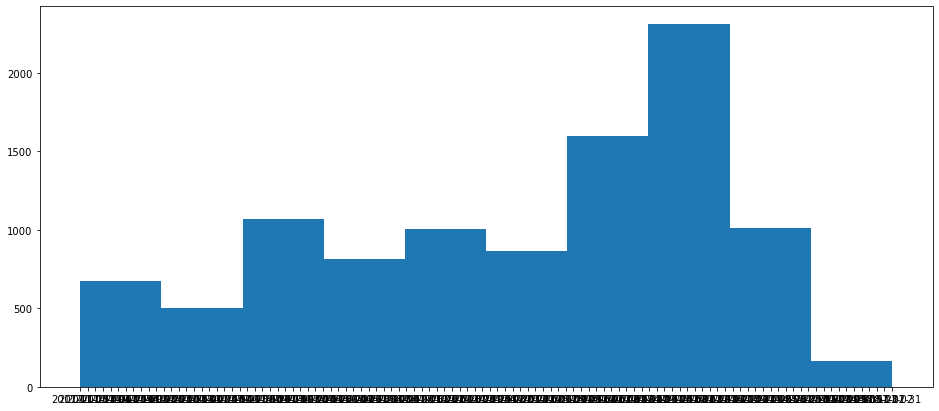

In [16]:
plt.figure(figsize=(16,7))
plt.hist( youtube_data["Date_uploaded"].head(10000))

In [19]:
correlation_list = ['views', 'likes', 'dislikes', 'comment_count']
hm_data = youtube_data[correlation_list].corr() 
display(hm_data)

,views,likes,dislikes,comment_count
views,1.000,0.849,0.472,0.618
likes,0.849,1.000,0.447,0.803
dislikes,0.472,0.447,1.000,0.700
comment_count,0.618,0.803,0.700,1.000


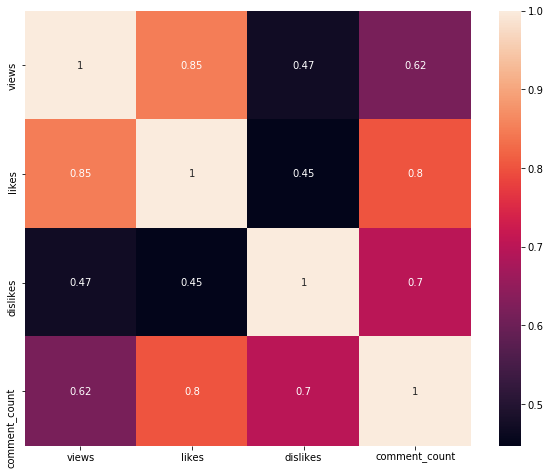

In [22]:
plt.figure(figsize=(10,8))
sns.heatmap(hm_data, annot=True);

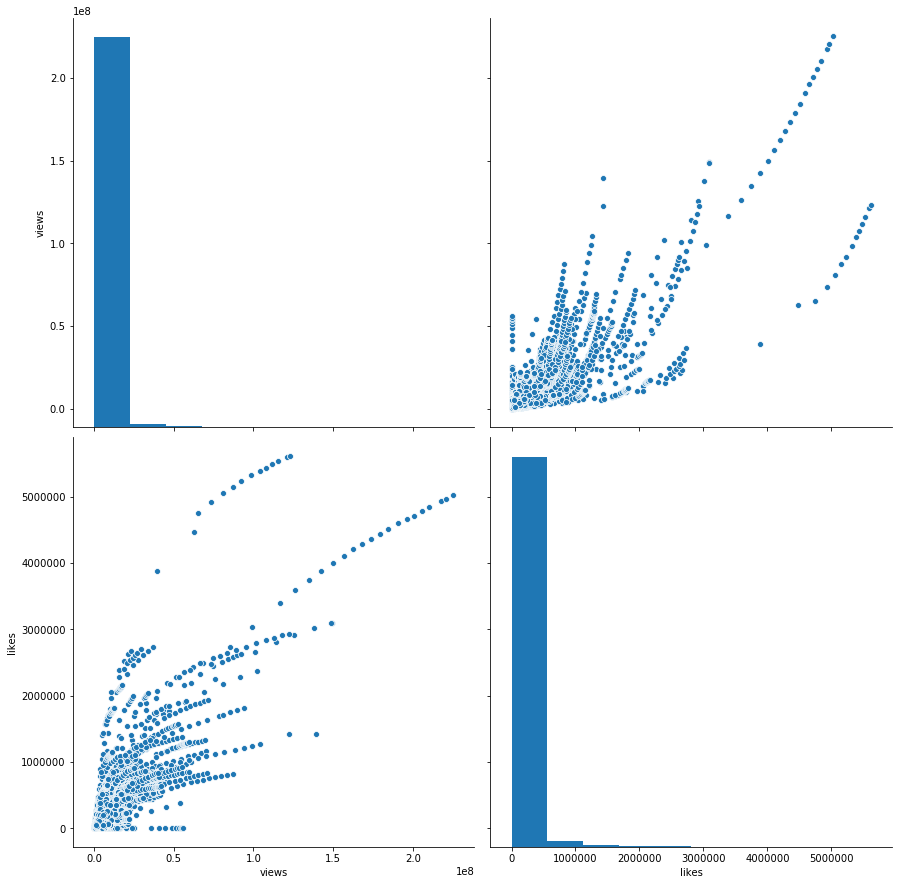

In [27]:
#matplotlib.pyplot.figure(figsize=(12,12))
sns.pairplot(youtube_data[['views', 'likes']],height=6);

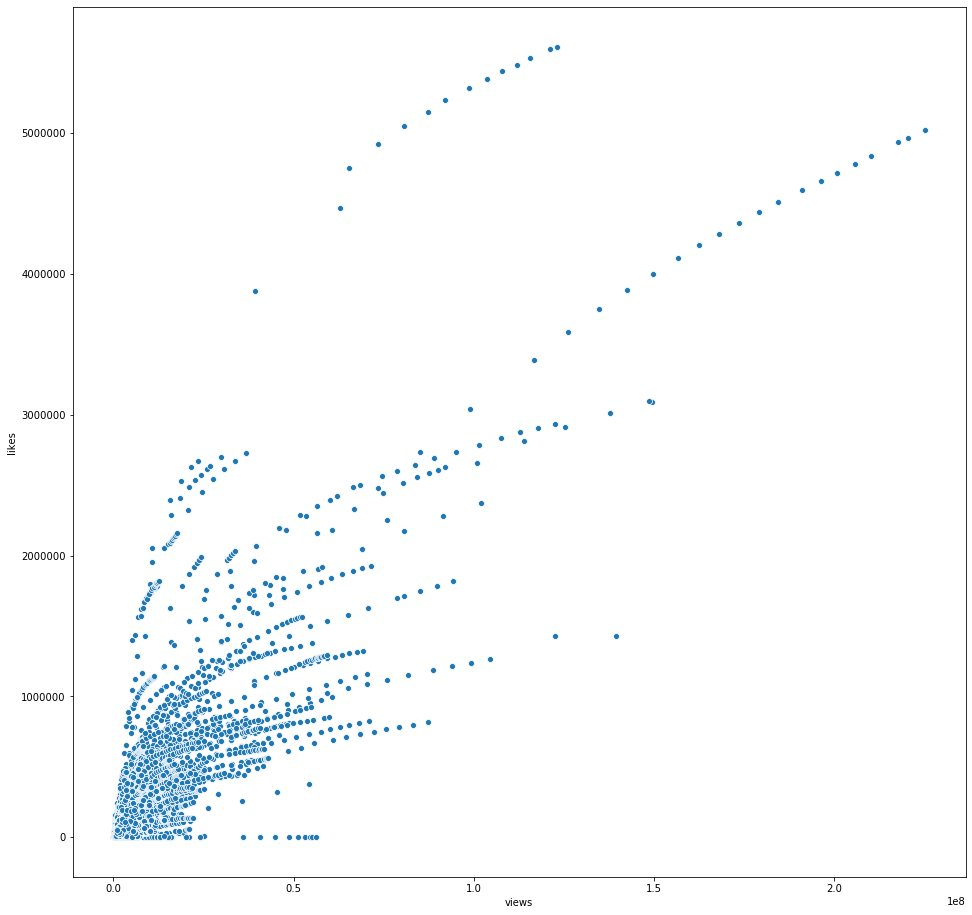

In [29]:
#to get a closer look at the scatterplot for likes/views
plt.figure(figsize=(16,16))
sns.scatterplot(x=youtube_data['views'], y=youtube_data['likes']);